# Tuto ResNet152V2

In this notebook, we are going to test the DeepCNN ResNet152V2. ResNet stands for Residual Network.
This project is highly inspired by the work of Utkarsh Saxena on Kaggle.
The Dataset is composed of Animal pictures of 10 categories taken from Google Images. The dataset is availaible with the following URL: https://www.kaggle.com/datasets/alessiocorrado99/animals10/download?datasetVersionNumber=2


In [2]:
# Common 
import os
import keras
import numpy as np
from glob import glob
from tqdm import tqdm 
import tensorflow as tf
from tensorflow.keras import layers

# Data
from keras.preprocessing.image import ImageDataGenerator
import scipy.integrate as integrate
# Data Viz
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import PIL
# Model
from keras import Sequential
from keras.models import load_model
from keras.layers import Dense, GlobalAvgPool2D as GAP, Dropout

# Callbacks
from keras.callbacks import ModelCheckpoint, EarlyStopping

# Transfer Learning Models
from tensorflow.keras.applications import ResNet50, ResNet50V2, InceptionV3, Xception, ResNet152, ResNet152V2

We check if the GPU is availaible

In [3]:
print("GPUs Available: ", len(tf.config.list_physical_devices('GPU')))


GPUs Available:  1


# Data visualization

In [4]:
import pathlib

After downloading the dataset, we translated the different folders from Italian to English.

In [5]:
# Main Path
path = 'C:/Users/Vanna/Python/Machine-Learning/Classification/raw-img'

# Get Class Names
class_names = sorted(os.listdir(path))
n_classes = len(class_names)
print(f"Class Names: \n{class_names}")
print(f"Total Number of Classes : {n_classes}")

Class Names: 
['butterfly', 'cat', 'chicken', 'cow', 'dog', 'elephant', 'horse', 'sheep', 'spider', 'squirrel']
Total Number of Classes : 10


In [6]:
class_distribution = [len(os.listdir(path + f"/{name}")) for name in class_names]
print(f"Class Distribution : \n{class_distribution}")

Class Distribution : 
[2112, 1668, 3098, 1866, 4863, 1446, 2623, 1820, 4821, 1862]


In [35]:
fig = px.pie(names=class_names, values=class_distribution, width=600)
fig.update_layout({"title":{'text':"Class Distribution","x":0.5}})
fig.show()

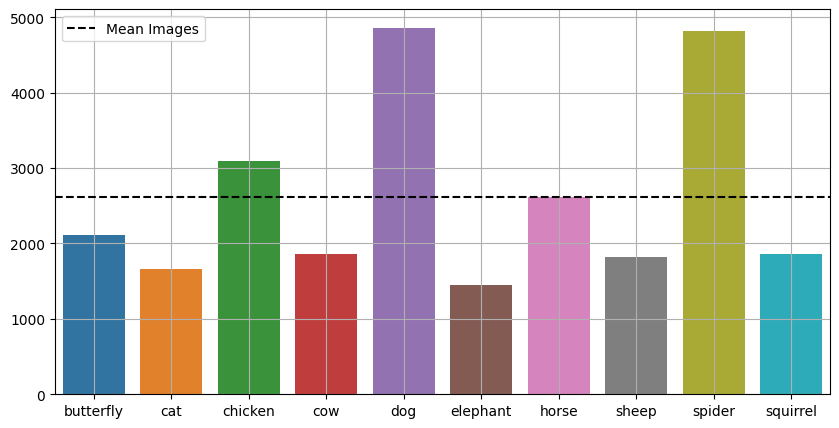

In [7]:
plt.figure(figsize=(10,5))
sns.barplot(x=class_names, y=class_distribution)
plt.grid()
plt.axhline(np.mean(class_distribution), color='k', linestyle='--', label="Mean Images")
plt.legend()
plt.show()

Some categories are over-represented, it could be a problem for our model.
Solution: data augmentation

In [8]:
import pathlib
data_dir = pathlib.Path(path)

In [9]:

image_count = len(list(data_dir.glob('*/*.*')))
print(image_count)

26179


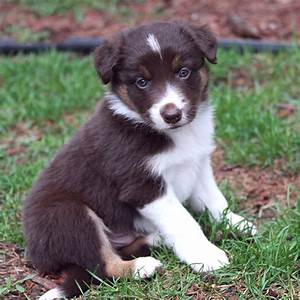

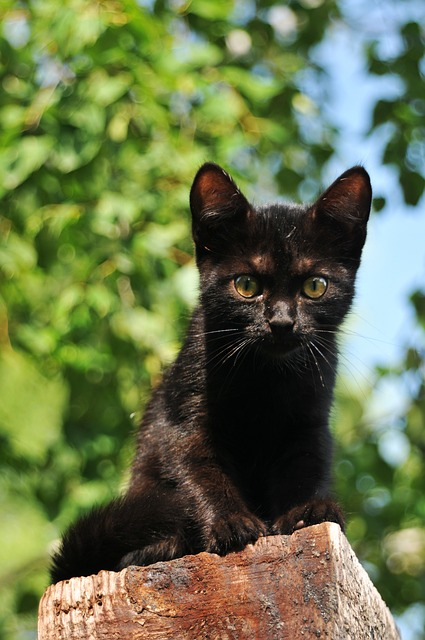

In [10]:
dog=list(data_dir.glob('dog/*'))
cat=list(data_dir.glob('cat/*'))
from IPython.display import Image
from IPython.display import display
x = PIL.Image.open(str(dog[4000]))
y = PIL.Image.open(str(cat[1500]))
display(x, y)

# Dataset Creation


In [10]:
batch_size = 32
img_height = 256
img_width = 256

In [16]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir, 
  validation_split=0.3,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 26179 files belonging to 10 classes.
Using 18326 files for training.


In [17]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.3,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 26179 files belonging to 10 classes.
Using 7853 files for validation.


In [82]:
# # Load data
# train_ds = gen.flow_from_directory(
#     path, 
#     target_size=(256,256), 
#     class_mode='binary', 
#     batch_size=32, 
#     shuffle=True, 
#     rescale=1./255, 
#     subset='training')

# val_ds = gen.flow_from_directory(
#     path, 
#     target_size=(256,256), 
#     class_mode='binary', 
#     batch_size=32, 
#     shuffle=True, 
#     subset='validation')

Found 20947 images belonging to 10 classes.
Found 5232 images belonging to 10 classes.


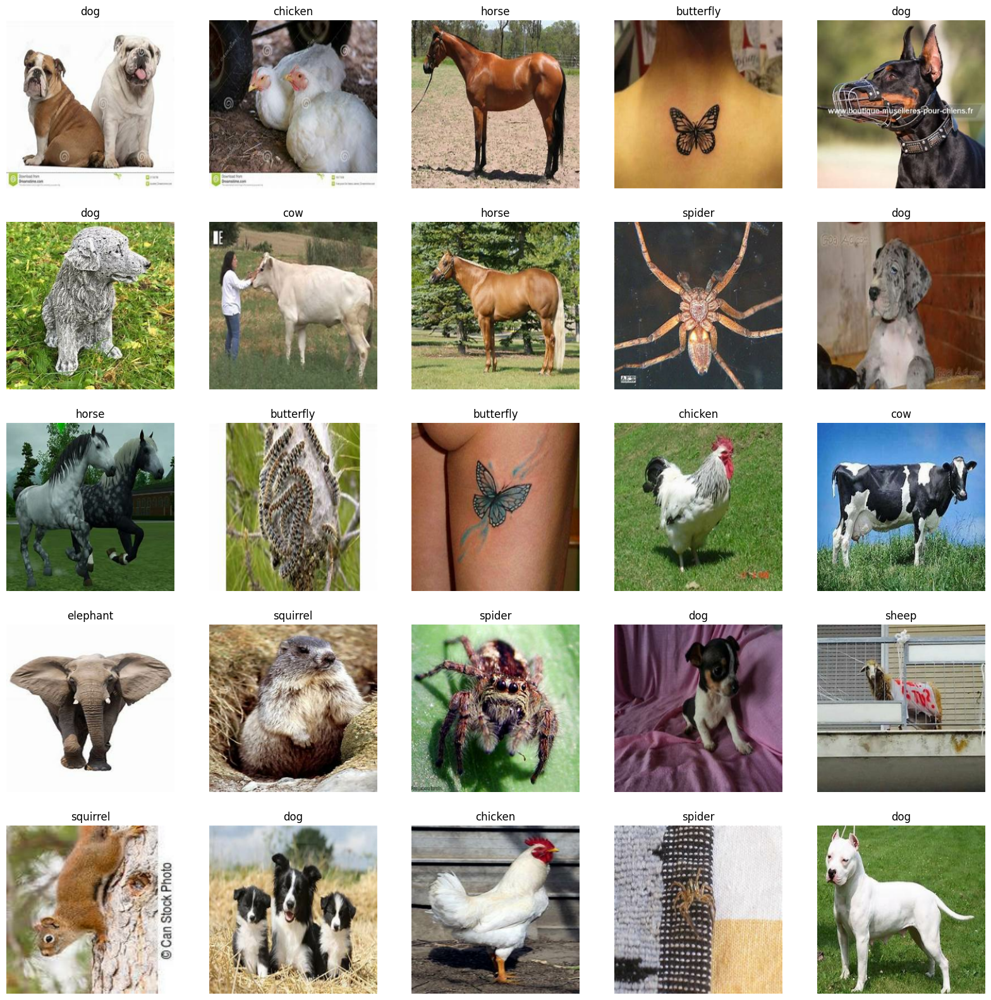

In [18]:
#Simpler code to display images
plt.figure(figsize=(20, 20))
for images, labels in train_ds.take(1):
  for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [19]:
def show_image(img, title=None):
    '''The function takes in a Image and plots it'''
    plt.imshow(img.numpy().astype(np.uint8))
    plt.title(title)
    plt.axis('off')
    
def get_random_data(data):
    images, labels = data
    id = np.random.randint(len(images))
    image, label = images[id], labels[id]
    return image, label


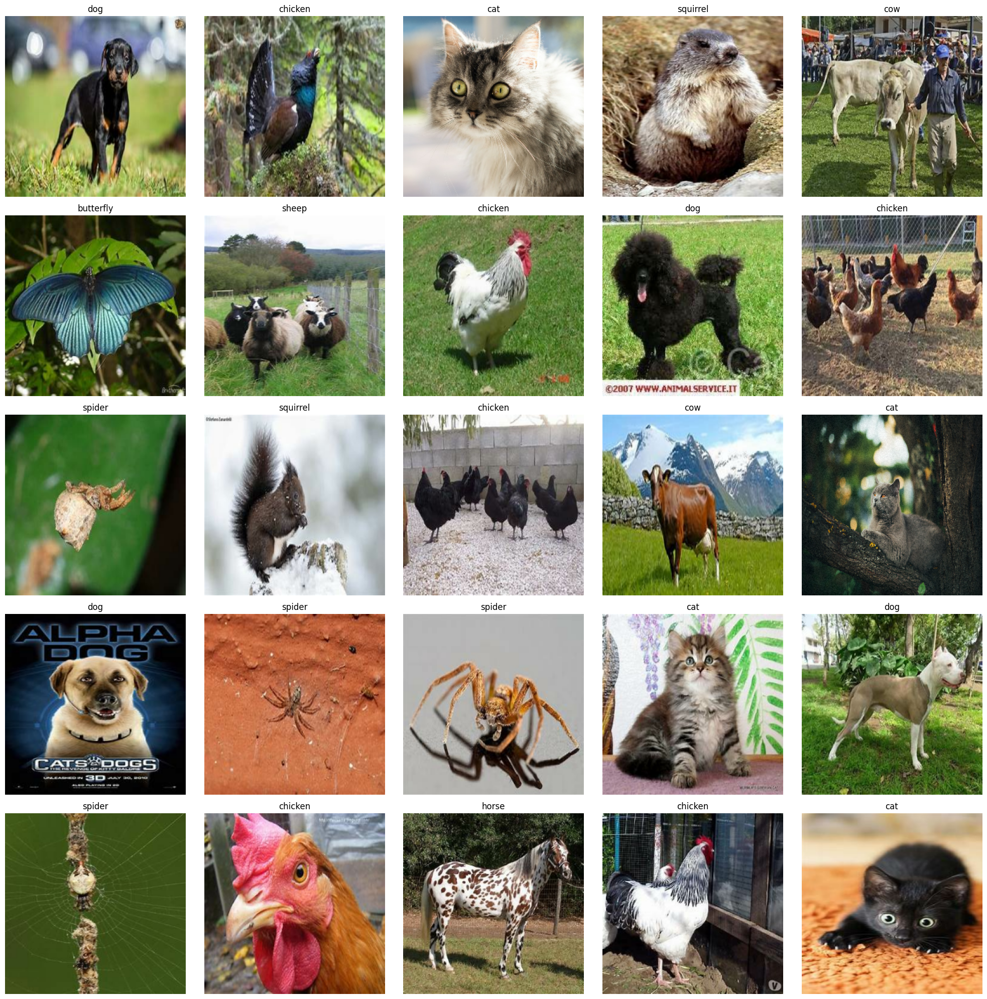

In [20]:
plt.figure(figsize=(20,20))
i=1
for images, labels in train_ds:
    
    # Get Random Image and label
    image, label = get_random_data([images, labels])
    
    # Plot it
    plt.subplot(5,5,i)
    show_image(image, title=class_names[label])
    
    # Make sure to end the Loop
    i+=1
    if i>=26: break
        
plt.tight_layout()
plt.show()

# Model

In [23]:
# Pretrained Model
name = "ResNet152V2"
model = ResNet152V2(include_top=False, input_shape=(256,256,3), weights='imagenet')
model.trainable = False # Freeze the Weights

# Model 
resnet152V2 = Sequential([
    layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
    model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(n_classes, activation='softmax')
], name=name)

# Compile
resnet152V2.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Callbacks 
cbs = [
    EarlyStopping(patience=5, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]
#

In [148]:
#model = keras.models.load_model("ResNet152V2.h5")


In [22]:
#model.summary()

In [24]:
resnet152V2.summary()

Model: "ResNet152V2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 resnet152v2 (Functional)    (None, 8, 8, 2048)        58331648  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_2 (Dense)             (None, 256)               524544    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 10)                2570      
                                                       

In [25]:
epochs=10

In [26]:
import scipy
from scipy import ndimage
try:
    import scipy
    print(scipy.__version__)
    #scipy.ndimage cannot be accessed until explicitly imported
    #print(ndimage.affine_transform.__doc__)
    from scipy import ndimage

except ImportError as e:
    print('test............',e)
    scipy = None

1.10.1


In [27]:
# Train Model
history=resnet152V2.fit(
    train_ds, 
    validation_data=val_ds,
    epochs=epochs, 
    callbacks=cbs
)

Epoch 1/10
573/573 [==============================] - 162s 265ms/step - loss: 0.1716 - accuracy: 0.9510 - val_loss: 0.1002 - val_accuracy: 0.9706
Epoch 2/10
573/573 [==============================] - 146s 255ms/step - loss: 0.0794 - accuracy: 0.9769 - val_loss: 0.1212 - val_accuracy: 0.9654
Epoch 3/10
573/573 [==============================] - 150s 261ms/step - loss: 0.0563 - accuracy: 0.9823 - val_loss: 0.1158 - val_accuracy: 0.9710
Epoch 4/10
573/573 [==============================] - 156s 273ms/step - loss: 0.0445 - accuracy: 0.9860 - val_loss: 0.1250 - val_accuracy: 0.9691
Epoch 5/10
573/573 [==============================] - 155s 271ms/step - loss: 0.0370 - accuracy: 0.9870 - val_loss: 0.1366 - val_accuracy: 0.9710
Epoch 6/10
573/573 [==============================] - 165s 288ms/step - loss: 0.0267 - accuracy: 0.9921 - val_loss: 0.1507 - val_accuracy: 0.9720


In [28]:
resnet152V2.evaluate(val_ds)

246/246 [==============================] - 43s 174ms/step - loss: 0.1002 - accuracy: 0.9706


[0.10018637776374817, 0.970584511756897]

In [29]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']





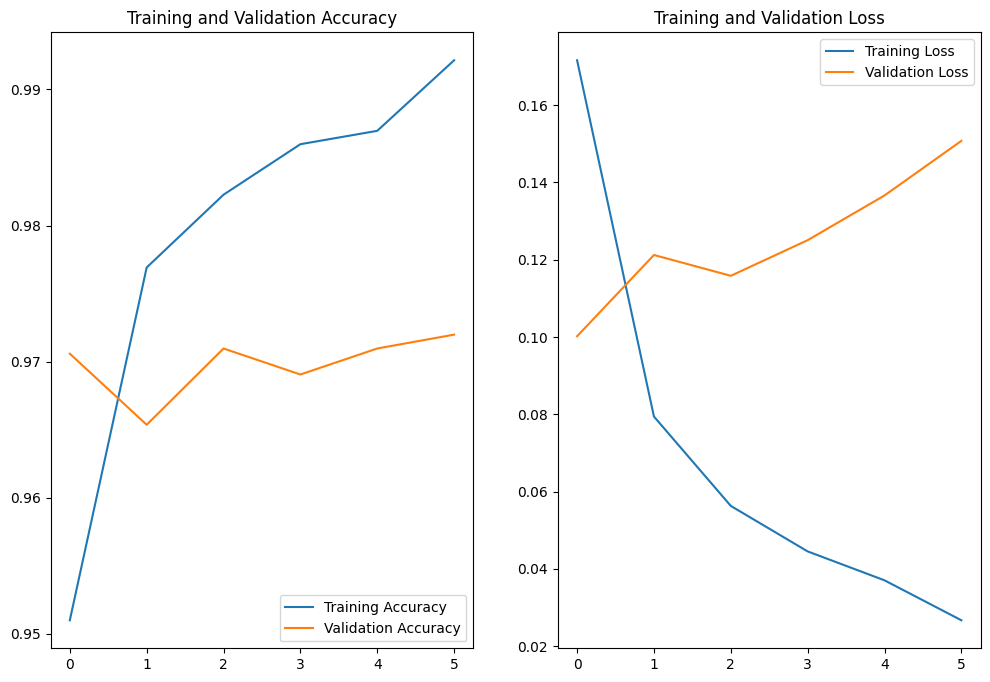

In [30]:
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(range(6), acc, label='Training Accuracy')
plt.plot(range(6), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(6), loss, label='Training Loss')
plt.plot(range(6), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [31]:
def predict_animal (str1,str2):
    photo_url= str
    photo_path=tf.keras.utils.get_file(str1 ,origin=str2)
    img = tf.keras.utils.load_img(
        photo_path, target_size=(img_height, img_width))
    
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0) # Create a batch

    predictions = resnet152V2.predict(img_array)
    score = tf.nn.softmax(predictions[0])

    print(
        "This image most likely belongs to {} with a {:.2f} percent confidence."
        .format(class_names[np.argmax(score)], 100 * np.max(score))
    )
    print (score)
    


In [32]:
predict_animal('chat3','https://www.agria.fr/imagevault/publishedmedia/9vgy569fypmkernjg4x6/Orange_cat_laying_indoor.jpg')

1/1 [==============================] - 2s 2s/step
This image most likely belongs to cat with a 23.20 percent confidence.
tf.Tensor(
[0.08533677 0.23196901 0.08533677 0.08533677 0.08533687 0.08533677
 0.08533677 0.08533677 0.08533677 0.08533677], shape=(10,), dtype=float32)


### Results on prediction
tf.nn.softmax is used to compute the softmax activations on predictions. The sum of all outputs generated by softmax is 1.
We used the same function as in Classifier_CNN_tuto and the result is less satisfying. We only have a 23.19 percent confidence that the predicted animal is a cat and we can see on the score tensor that the other animals have a percent confidence of 8,5%. So, is it really a percentage that shows confidence in the prediction or is it just a score that gives us the animal categorie with the most point ?

1/1 [==============================] - 0s 34ms/step


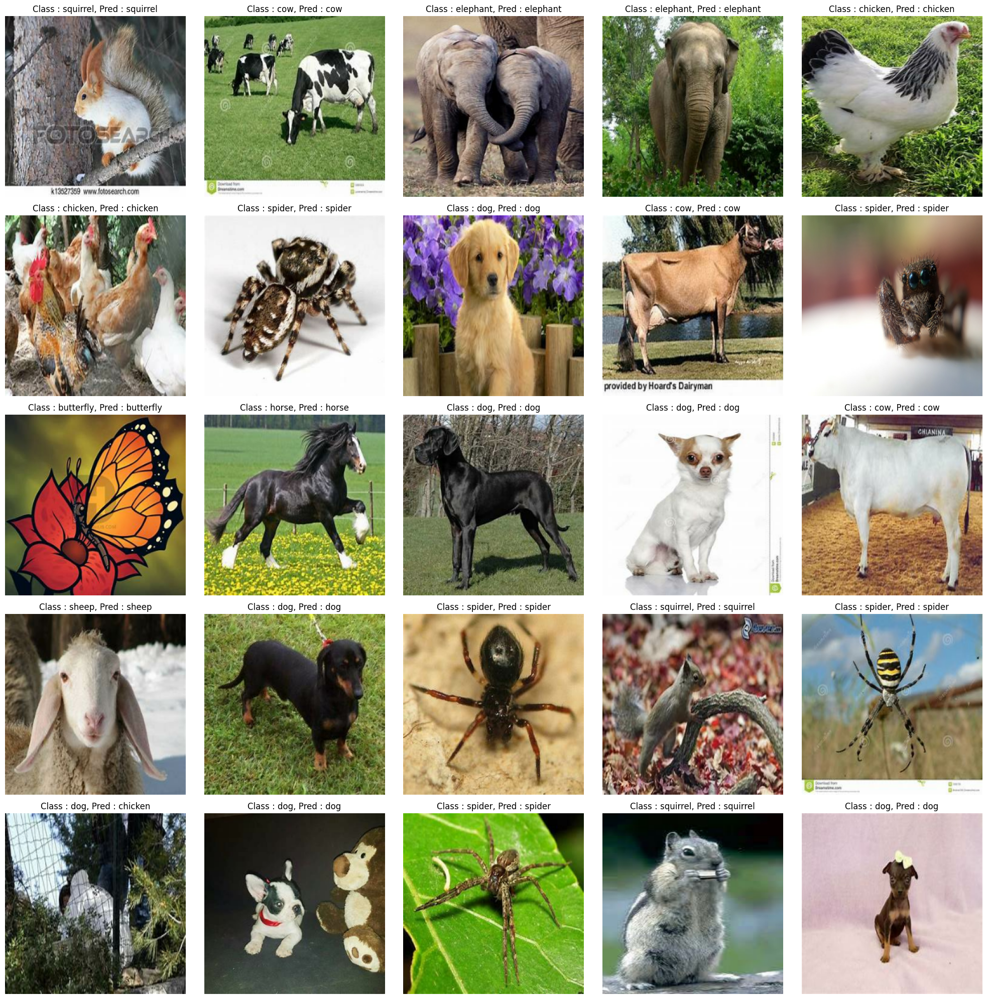

In [33]:
plt.figure(figsize=(20,20))
i=1
for images, labels in iter(val_ds):
    
    # Get Random Image and label
    image, label = get_random_data([images, labels])
    pred_label = class_names[np.argmax(resnet152V2.predict(image[np.newaxis,...]))]
    #np.argmax takes the highest score of the prediction tensor
    # Plot it
    plt.subplot(5,5,i)
    show_image(image, title=f"Class : {class_names[int(label)]}, Pred : {pred_label}")
    
    i+=1
    if i>=26: break
        

plt.tight_layout()
plt.show()